# Objaverse Dataset

A few experiments on the Objaverse dataset. It turned out to be too challenging to use, especially to compute the operators. Hence we focused only on ShapeNet.

In [1]:
%matplotlib widget

import os
import sys
import random
import multiprocessing
from tqdm import tqdm

import numpy as np

import objaverse
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import trimesh

sys.path.append("../../src/")  # add the path to the DiffusionNet src
import diffusion_net

np.random.seed(0)
random.seed(0)
processes = multiprocessing.cpu_count()

print(objaverse.__version__, processes) 

0.1.7 64


## Objaverse Dataset

In this section we perform a simple exploration of the Objaverse 1.0 dataset, and visualize some objects with challenging geometries.  
It's widely inspired from the example notebook from the Objaverse website

In [29]:
uids = objaverse.load_uids()
annotations = objaverse.load_annotations()
print(len(uids), type(uids))
print(annotations[uids[0]].keys())

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 160/160 [02:24<00:00,  1.11it/s]

798759 <class 'list'>
dict_keys(['uri', 'uid', 'name', 'staffpickedAt', 'viewCount', 'likeCount', 'animationCount', 'viewerUrl', 'embedUrl', 'commentCount', 'isDownloadable', 'publishedAt', 'tags', 'categories', 'thumbnails', 'user', 'description', 'faceCount', 'createdAt', 'vertexCount', 'isAgeRestricted', 'archives', 'license'])


In [71]:
uids = objaverse.load_uids()
random_object_uids = random.sample(uids, 100)
random_object_uids

['f82039689f504922995936c68484aa61',
 'fb42332b3f5e491cb0c4b5ba7ed6f374',
 'd633b522306b4499a8e6f1ac5f517864',
 '89da97b84f4d4fbc825bf3e914d45e92',
 '32aaba5aa1954cb898111bf884404039',
 'f84c8cbd56d94be18a727c66de2c2d51',
 '6afcf8814d494372a4f3f7e3b99219ba',
 '38cb6584bb734d729baf712da41b141f',
 'f9b8b1cea04243a7bf706c4565027187',
 '306aa51bb3c24464886dce788547e6cb',
 'df4d2da4e9934b82b30f9bcab685a0fd',
 '45509feed4534fa1a34567ae82c457cf',
 'b86569c202fa455b8d221e90c5588cc7',
 '00ae6eda19634ee6b0a4a52789c9ff90',
 'bfd6abe69bde4ee7806ef3fa483b0655',
 '1b1c987aa5914a4f85eecca0a6ba9b4e',
 '7842c2ad6fe74224974d64958baea75d',
 'a018d452856f4452958e081f77cdc253',
 '9e6bd36b7b94412a9c71fdc34561a934',
 '6845849028774ca782f0e2e221c69944',
 '60a206c7952c420e844640de850f4fcf',
 'd0ca35386b0b48418f8669da1bea0923',
 '61955029fd2c48d9a6eb6c6097f93b6c',
 '329684e1e63d4d16bcf519cc9571c1fb',
 '06d70683684b4b4cbc3da27c5507ee6a',
 '71aad2b07e5a4d4bb75f4acbdb6a1aa2',
 '4954590a8ea7404f9c4a83a446313f07',
 

We the objects corresponding to the 100 randomly samples uids

In [72]:
objects = objaverse.load_objects(
    uids=random_object_uids,
    download_processes=processes
)
objects

{'f82039689f504922995936c68484aa61': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-120/f82039689f504922995936c68484aa61.glb',
 'fb42332b3f5e491cb0c4b5ba7ed6f374': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-003/fb42332b3f5e491cb0c4b5ba7ed6f374.glb',
 'd633b522306b4499a8e6f1ac5f517864': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-011/d633b522306b4499a8e6f1ac5f517864.glb',
 '89da97b84f4d4fbc825bf3e914d45e92': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-143/89da97b84f4d4fbc825bf3e914d45e92.glb',
 '32aaba5aa1954cb898111bf884404039': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-136/32aaba5aa1954cb898111bf884404039.glb',
 'f84c8cbd56d94be18a727c66de2c2d51': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-110/f84c8cbd56d94be18a727c66de2c2d51.glb',
 '6afcf8814d494372a4f3f7e3b99219ba': '/home/infres/lmartinez-21/.objaverse/hf-objaverse-v1/glbs/000-068/6afcf8814d494372a4f3f7e3b99219ba.glb',

Now let's show some of them

In [36]:
obj = objaverse.load_objects(uids=['47d019b5d3244cceb63fd47e6fdf5410'])
scene = trimesh.load(list(obj.values())[0])
scene.show()

In [75]:
scene = trimesh.load(list(objects.values())[0])
scene.show()

In [34]:
lvis_annotations = objaverse.load_lvis_annotations()
obj_id = lvis_annotations['Bible'][0]

def load_obj(obj_id: str):
    obj = objaverse.load_objects(
        uids=[obj_id],
        download_processes=processes
    )
    
    return obj

def show_obj(obj):
    scene = trimesh.load(list(obj.values())[0])
    scene.show()
    
obj = load_obj(obj_id)

starting download of 1 objects with 64 processes
Downloaded 1 / 1 objects


In [35]:
len(lvis_annotations)

1156

In [78]:
min_class = 1000000
min_key, max_key = '', ''
max_class = 0
lengths = np.zeros(len(lvis_annotations))


for i, (key, val) in enumerate(lvis_annotations.items()):
    l = len(val)
    lengths[i] = l
    if l < min_class:
        min_class = l
        min_key = key
    if l > max_class:
        max_class = l
        max_key = key

In [111]:
lvis_annotations.items()

dict_items([('Band_Aid', ['d4c9180a46cf401fa24fa3afe9237a43', '655444d3fcdc4eef9cfc993daeb4fa37', 'dc19a68329ab435fa32344269e5a27dc', 'e9fe70b8fc094d26a08bb4b8c1c37518', '6381d903bfee46dfa66e285f9717d087', '77f578670b59423b98e5ad9965560b9e', '56d77628e4f8461cb47f3bceb610397e', '32d5faef157f488fb146f46ec4a7ffab', 'ea0cf48616e34708b73c82eb7c7366ca']), ('Bible', ['ee7660359dda4c90990cb7440211b873', '3e5393bd35e34531a576e22d45611060', 'f5bf29193be44caaad2df1db3db44871', 'adde1e2669d14286843bc9f1cff9ae45', 'f0ed46d723dd441bb592d715db241097', '9d3007d40ca84bb7baec1f1a04e0f08d', '797e7c7f61104b6785c3bd0fdb99c74d', '149d47c6c27648a6af26d6c912c03826', '8257772b0e2f408ba269264855dfea00', 'e7b30aa0ad754744bb5344bc86bf794a', 'a077fd75db084974b273675dd6c5db69', '14cb3dea14864901af33816436a50b53', '604fd1202d9c4ef296e56dd7be91f9ca', 'b8a709a4b82a4fb7b545fe178f8f46df', '8659627809a54d75ab1b81c29d9a4c56', '2c484a78361a432ca974589a88ccd9f1', '10965a1ebcd64aa8b5dbafce0c7926a2', '5247b702b0eb464fafa4fe80

In [80]:
def save_off(source_path, save_path):
    file_name = source_path.split('/')[-1][:-4] # remove .glb
    off_path = os.path.join(save_path, f'{file_name}.off')
    scene = trimesh.load(source_path)
    geometries = scene.dump()

    mesh = trimesh.util.concatenate(geometries)
    mesh.export(off_path)

def create_dataset(root):
    if not os.path.isdir(root): os.mkdir(root)
    
    for cls, ids in tqdm(filtered_annotations.items()):
        cls_path = os.path.join(root, cls)
        if not os.path.isdir(cls_path): os.mkdir(cls_path)
        objects = objaverse.load_objects(
            uids=ids,
            download_processes=processes
        )
        for idx, path in objects.items():
            save_off(path, os.path.join(cls_path))
        break
        
            
        
create_dataset('dataset')

  0%|                                                                                                                                                                                       | 0/319 [00:00<?, ?it/s]

starting download of 17 objects with 64 processes
Downloaded 1 / 17 objectsDownloaded
 2 / 17 objects
DownloadedDownloaded 6  6/  / 1717  objectsobjects

Downloaded 6 / 17 objects
Downloaded 6 / 17 objects
Downloaded 7 / 17 objects
Downloaded 9 / 17 objects
DownloadedDownloaded 10  /10 17  /objects 
17 objects
Downloaded 11 / 17 objects
Downloaded 12 / 17 objects
Downloaded 13 / 17 objects
Downloaded 14 / 17 objects
Downloaded 15 / 17 objects
Downloaded 16 / 17 objects
Downloaded 17 / 17 objects


  0%|                                                                                                                                                                                       | 0/319 [01:05<?, ?it/s]


In [81]:

np.array(lvis_annotations['zebra'])[np.random.permutation(15)]

array(['6626c646918448cfbabe1c70d8836acf',
       '7b323d3fbea44d6092311dcd12016e18',
       '64350a72ad11412b9725721d8b27d225',
       '9303a9d30d86416099bdf466c17350bb',
       'c4abca2559ea42a7bbd252e6985078ff',
       '23ce25036e4545f88d60d1d6bb758ebe',
       '7e42eeabb07843a9a5617366319bf345',
       '24113eec279d488897a4997d5dd1e128',
       '71ff597228264500b3566dcbc54e5a8f',
       'f69abac8cc7f4458ac86f525d1a65f4b',
       'ff2875fb1a5b4771805a5fd35c8fe7bb',
       '0a782cf62bde4206999bdd83021f082d',
       '2546097d0ea94ba88452ce62c041fb87',
       '439c950dd1f242868dd9d8fc0a2dcd57',
       '063ceb75b220463fa2dde8df4154ba2e'], dtype='<U32')

To choose how to build the dataset, we have a look at the distribution of the number objects per class

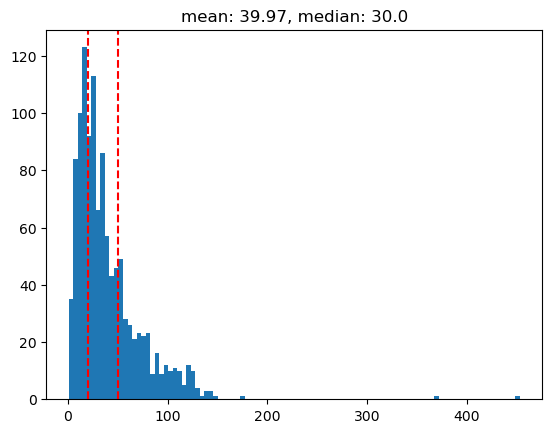

In [82]:
plt.title(f'mean: {lengths.mean():.2f}, median: {np.median(lengths)}')
plt.hist(lengths, bins=100)
plt.axvline(20, ls='--', c='r')
plt.axvline(50, ls='--', c='r')
plt.show()

We align the parameters of the SHREC11 dataset (as we aim to apply transfer knowledge learned from objaverse to it). SHREC11 is made of 600 samples across 30 classes, thus 20 models/class.

**So we keep all the classes from objaverse containing more than 20 models. For those exceeding 20, we randomly sample 20 models to get well balanced classes.**

In [83]:
print(f'{len(lengths[lengths >= 50])} classes containing more than 20 samples')

319 classes containing more than 20 samples


In [84]:
min_key, min_class, max_key, max_class

('bolo_tie', 1, 'chair', 453)

Classes are widely imbalanced. It's thus pointless to simply feed the raw dataset to a DiffusionNet if we aim to perform decent performance and representation learning.

In [85]:
scene = trimesh.load(list(obj.values())[0])
scene.show()

In [86]:
geometries = scene.dump()

# Concatenate all geometries into a single mesh
combined_mesh = trimesh.util.concatenate(geometries)
res = combined_mesh.export('sample.off')

'OFF\n531 436 0\n-0.0661264608 0.0175196980 0.0757772979\n-0.0552573629 0.0214213952 0.0757772979\n-0.0552573629 0.0214213952 -0.0757772979\n-0.0661264608 0.0175196980 -0.0757772979\n-0.0029987620 0.0135736152 -0.0757772979\n-0.0029987620 0.0135736152 0.0757772979\n0.0000949859 0.0083674761 0.0757772979\n0.0000949859 0.0083674761 -0.0757772979\n-0.0131840240 0.0191260814 0.0757772979\n-0.0131840240 0.0191260814 -0.0757772979\n-0.0236371147 0.0227228261 0.0757772979\n-0.0236371147 0.0227228261 -0.0757772979\n-0.0340948114 0.0239459848 0.0757772979\n-0.0340948114 0.0239459848 -0.0757772979\n-0.0446300227 0.0234270442 0.0757772979\n-0.0446300227 0.0234270442 -0.0757772979\n0.0661264628 0.0175196980 0.0757772979\n0.0661264628 0.0175196980 -0.0757772979\n0.0552573649 0.0214213952 -0.0757772979\n0.0552573649 0.0214213952 0.0757772979\n0.0029987622 0.0135736152 -0.0757772979\n-0.0000949860 0.0083674761 -0.0757772979\n-0.0000949860 0.0083674761 0.0757772979\n0.0029987622 0.0135736152 0.0757772

In [15]:
import os
import shutil
total = 0
for f in os.listdir('data'):
    num = len(os.listdir(os.path.join('data', f)))
    print(num)
#     if num < 35:
#         print('removing ', f)
#         shutil.rmtree(os.path.join('data', f))

50
50
50
50
50
50
50
50
47
50
50
50
50
50
37
50
50
50
50
50
50
50
50
50
50
50
43
42
50
43
44
50
50
50
50
37
50
50
49
50
50
38
50
50
46


## Transfer learning

This section contains all the building blocks of our main experiment. Concretely, we evaluate the robsutness of the representations learned by a DiffusionNet on the Objaverse dataset.

In [3]:
model = diffusion_net.layers.DiffusionNet(C_in=3,
                                          C_out=42,
                                          C_width=64, 
                                          N_block=6, 
                                          last_activation=lambda x : torch.nn.functional.log_softmax(x,dim=-1),
                                          outputs_at='global_mean', 
                                          dropout=False)

ckpt = torch.load('saved_models_difffit64_diffblk6_dropout/model_190_xyz.pth', weights_only=True)

model.load_state_dict(ckpt)

for param in model.parameters():
    param.requires_grad = False

model.last_lin = nn.Linear(64, 30)
# model.block_7 = diffusion_net.layers.DiffusionNetBlock(C_width = 64, dropout = True, mlp_hidden_dims = [64,64])

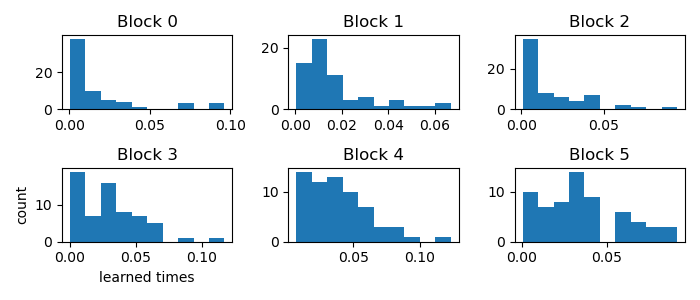

In [8]:
times = []
times.append(next(iter(model.block_0.diffusion.parameters())).data)
times.append(next(iter(model.block_1.diffusion.parameters())).data)
times.append(next(iter(model.block_2.diffusion.parameters())).data)
times.append(next(iter(model.block_3.diffusion.parameters())).data)
times.append(next(iter(model.block_4.diffusion.parameters())).data)
times.append(next(iter(model.block_5.diffusion.parameters())).data)
# times.append(next(iter(model.block_6.diffusion.parameters())).data)
# times.append(next(iter(model.block_7.diffusion.parameters())).data)
fig, axes = plt.subplots(2, 3, figsize=(7,3))
ax = axes.ravel()
for i, t in enumerate(times):
    ax[i].hist(t.numpy())
    ax[i].set_title(f'Block {i}')
    if i == 3:
        ax[i].set_ylabel('count')
        ax[i].set_xlabel('learned times')
plt.tight_layout()